In [9]:
from numqt import *

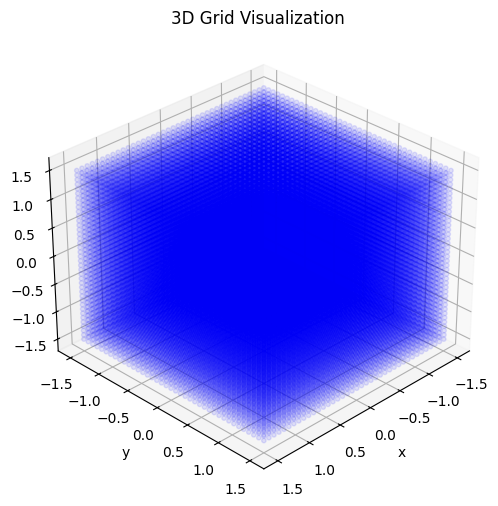

39 39 39


In [10]:
#-----------------------------------------------------------
# Characteristic lengths of the problem
#-----------------------------------------------------------
Lx = 3 # Confinement length along x
Ly = 3 # Confinement length along y
Lz = 3 # Confinement length along z

#-----------------------------------------------------------
# Problem's parameters
#-----------------------------------------------------------
hbar = 1
m = 1 # e-mass

#-----------------------------------------------------------
# Simulation parameters
#-----------------------------------------------------------
xbounds = (-Lx/2, Lx/2) # confinement length
ybounds = (-Ly/2, Ly/2) # confinement length
zbounds = (-Lz/2, Lz/2) # confinement length

dx_max = 0.1 # Global maximum allowed spacing
dy_max = 0.1 # Global maximum allowed spacing
dz_max = 0.1 # Global maximum allowed spacing


#-----------------------------------------------------------
# Creating grid
#-----------------------------------------------------------
mesh_obj = Mesh(dims=3,
                 xbounds=xbounds,
                 ybounds=ybounds,
                 zbounds=zbounds,   
                 dx_max=dx_max,
                 dy_max=dy_max,
                 dz_max=dz_max,
                 dx_func = None,
                 dy_func= None,
                 dz_func= None,
                 max_iter= 10)

dimx = mesh_obj.Nx
dimy = mesh_obj.Ny
dimz = mesh_obj.Nz
mesh_obj.visualize_grid(alpha = 0.1)
print(dimx, dimy, dimz)

In [15]:
#-----------------------------------------------------------
# Obtaining canonical operators
#-----------------------------------------------------------
operators = canonic_ops(mesh_obj, additional_subspaces = None, hbar=1)
px2 = operators.get_ops()["p2"][0]
py2 = operators.get_ops()["p2"][1]
pz2 = operators.get_ops()["p2"][2]


#-----------------------------------------------------------
# Constructing the Hamiltonian
#-----------------------------------------------------------
H = Hamiltonian((px2 + py2 + pz2) / (2*m), mesh_obj)

In [16]:
k = 100
energies, wavefunctions = H.solve(k)

In [41]:
H.plot(9)

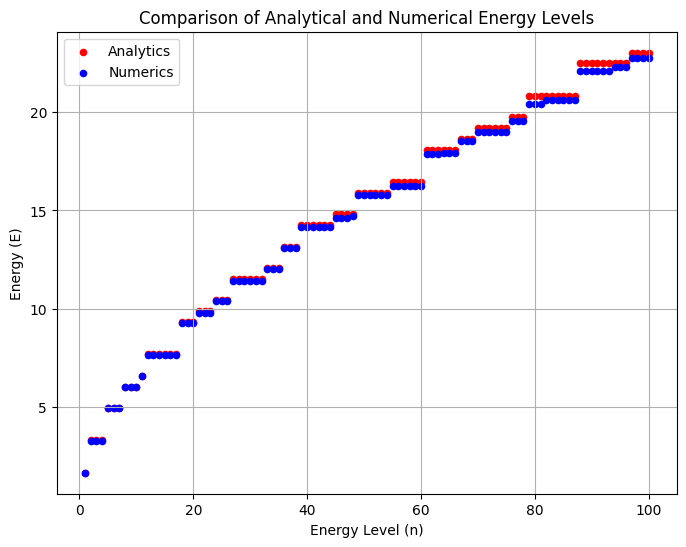

In [18]:
# Define the analytical energy function
def energy(nx, ny, nz):
    return nx**2 * np.pi**2 * hbar**2  / (2 * m * Lx**2) + ny**2 * np.pi**2 * hbar**2  / (2 * m * Ly**2) + nz**2 * np.pi**2 * hbar**2  / (2 * m * Lz**2)

# Generate analytical energy levels
analytical_energies = sorted([energy(nx, ny, nz) for nx in range(1, k+1) for ny in range(1, k+1) for nz in range(1, k+1)])[:k]

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(range(1, k+1), analytical_energies, c="r", s=20, label="Analytics")
plt.scatter(range(1, k+1), energies, c="b", s=20, label="Numerics")
plt.legend()
plt.ylabel("Energy (E)")
plt.xlabel("Energy Level (n)")
plt.title("Comparison of Analytical and Numerical Energy Levels")
plt.grid(True)

plt.show()